#  Comportamiento check in New york:


In [1]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import powerlaw
from sklearn.metrics import silhouette_score
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from tslearn.metrics import dtw
from tslearn.clustering import KShape
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster
from tslearn.metrics import dtw
import numpy as np
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from collections import Counter
import random
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist


In [2]:
#Powerlaw: A Python Package for Analysis of Heavy-Tailed Distributions
# Initialize an empty list to store the data
data = []

# Open the text file for reading with the specified encoding
with open(r'C:\Users\oscar\OneDrive - Universidad Nacional de Colombia\Tesis\Comportamineto humano\Articulos New york profe Riascos\dataset_tsmc2014\dataset_TSMC2014_NYC.txt', 'r', encoding='latin-1') as file:
    # Read each line in the file
    for line in file:
        # Split the line into columns based on the tab delimiter
        columns = line.strip().split('\t')
        
        # Append the columns to the data list
        data.append(columns)

# Define the column names
column_names = ['User ID', 'Venue ID', 'Venue category ID', 'Venue category name', 'Latitude', 'Longitude', 'Timezone offset in minutes', 'UTC time']

# Create a DataFrame from the data list
df = pd.DataFrame(data, columns=column_names)

# Optionally, convert columns to appropriate data types
df['Latitude'] = df['Latitude'].astype(float)
df['Longitude'] = df['Longitude'].astype(float)
df['Timezone offset in minutes'] = df['Timezone offset in minutes'].astype(int)

# Display the DataFrame
df.head()


,User ID,Venue ID,Venue category ID,Venue category name,Latitude,Longitude,Timezone offset in minutes,UTC time
0,470,49bbd6c0f964a520f4531fe3,4bf58dd8d48988d127951735,Arts & Crafts Store,40.719810,-74.002581,-240,Tue Apr 03 18:00:09 +0000 2012
1,979,4a43c0aef964a520c6a61fe3,4bf58dd8d48988d1df941735,Bridge,40.606800,-74.044170,-240,Tue Apr 03 18:00:25 +0000 2012
2,69,4c5cc7b485a1e21e00d35711,4bf58dd8d48988d103941735,Home (private),40.716162,-73.883070,-240,Tue Apr 03 18:02:24 +0000 2012
3,395,4bc7086715a7ef3bef9878da,4bf58dd8d48988d104941735,Medical Center,40.745164,-73.982519,-240,Tue Apr 03 18:02:41 +0000 2012
4,87,4cf2c5321d18a143951b5cec,4bf58dd8d48988d1cb941735,Food Truck,40.740104,-73.989658,-240,Tue Apr 03 18:03:00 +0000 2012


In [3]:
print('hay',df['User ID'].unique().size, 'usuarios únicos')
def get_most_entries_user(df):
    user_counts = df['User ID'].value_counts()
    most_entries_user = user_counts.idxmax()
    most_entries_count = user_counts.max()
    return most_entries_user, most_entries_count

most_entries_user, most_entries_count = get_most_entries_user(df)
print(f"The user ID with the most entries is {most_entries_user} with {most_entries_count} entries.")


hay 1083 usuarios únicos
The user ID with the most entries is 293 with 2697 entries.


## 1)Histograma semanal usuario 293

#### Primero intentamos el histograma de la semana para una persona

In [4]:
user_293 = df[df['User ID'] == '293'][['User ID', 'UTC time']]
user_293['UTC time'] = pd.to_datetime(user_293['UTC time'])
user_293 = user_293.sort_values('UTC time')#Esta organizado por este tiempo
user_293['Time Difference τ'] = user_293['UTC time'].diff()


user_293.head()

C:\Users\oscar\AppData\Local\Temp\ipykernel_8412\2112416221.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  user_293['UTC time'] = pd.to_datetime(user_293['UTC time'])


,User ID,UTC time,Time Difference τ
690,293,2012-04-03 23:56:43+00:00,NaT
760,293,2012-04-04 00:19:13+00:00,0 days 00:22:30
763,293,2012-04-04 00:19:44+00:00,0 days 00:00:31
766,293,2012-04-04 00:21:12+00:00,0 days 00:01:28
1121,293,2012-04-04 04:53:06+00:00,0 days 04:31:54


In [5]:
user_293['DAY_OF_THE_WEEK'] = user_293['UTC time'].dt.day_name()
user_293.head()

,User ID,UTC time,Time Difference τ,DAY_OF_THE_WEEK
690,293,2012-04-03 23:56:43+00:00,NaT,Tuesday
760,293,2012-04-04 00:19:13+00:00,0 days 00:22:30,Wednesday
763,293,2012-04-04 00:19:44+00:00,0 days 00:00:31,Wednesday
766,293,2012-04-04 00:21:12+00:00,0 days 00:01:28,Wednesday
1121,293,2012-04-04 04:53:06+00:00,0 days 04:31:54,Wednesday


### 2.1)Sacando un histograma para el lunes

C:\Users\oscar\AppData\Local\Temp\ipykernel_8412\409999547.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_293_monday['Hour'] = user_293_monday['UTC time'].dt.hour + user_293_monday['UTC time'].dt.minute / 60#para incluir los minutos


23.983333333333334 0.2


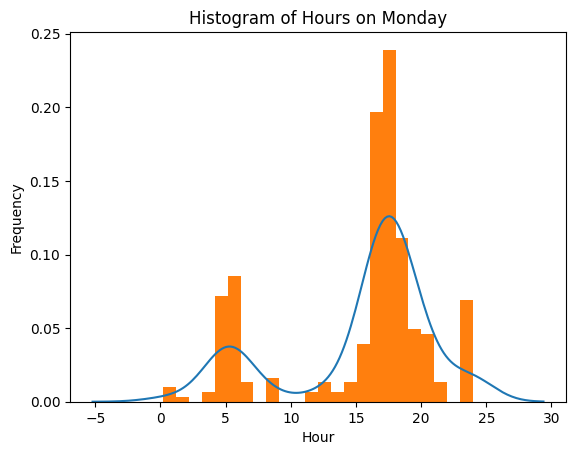

In [6]:

user_293_monday = user_293[user_293['DAY_OF_THE_WEEK'] == 'Monday']

# Create una columna que me de las horas dadas por utc time

user_293_monday['Hour'] = user_293_monday['UTC time'].dt.hour + user_293_monday['UTC time'].dt.minute / 60#para incluir los minutos
user_293_monday.head()

# El histograma
tau_monday= user_293_monday['Hour']
print(max(tau_monday), min(tau_monday))
# hISTOGRAM OF tau_monday
sns.kdeplot(tau_monday)
plt.hist(tau_monday, bins=24, density=True)#toma la frecuenecia en escala log, tenemos binds lineales
plt.xlabel('Hour')
plt.ylabel('Frequency') 
plt.title('Histogram of Hours on Monday')
plt.show()



### 2.2)El histograma de la semana 

In [7]:
# Concatenate the data from all days
user_293_all_days = pd.concat([user_293_monday, user_293[user_293['DAY_OF_THE_WEEK'] != 'Monday']])

# Create a column that represents the hours of the day
user_293_all_days['Hour'] = user_293_all_days['UTC time'].dt.dayofweek * 24 + user_293_all_days['UTC time'].dt.hour + user_293_all_days['UTC time'].dt.minute / 60
user_293_all_days.head()    

# Create a column that represents the hours of the day

user_293_all_days.head(1000)


,User ID,UTC time,Time Difference τ,DAY_OF_THE_WEEK,Hour
6187,293,2012-04-09 11:57:14+00:00,0 days 16:25:52,Monday,11.950000
6188,293,2012-04-09 11:57:30+00:00,0 days 00:00:16,Monday,11.950000
6282,293,2012-04-09 12:32:09+00:00,0 days 00:34:39,Monday,12.533333
6346,293,2012-04-09 12:56:28+00:00,0 days 00:24:19,Monday,12.933333
6709,293,2012-04-09 16:26:07+00:00,0 days 03:29:39,Monday,16.433333
...,...,...,...,...,...
119868,293,2012-07-03 17:57:41+00:00,0 days 00:01:27,Tuesday,41.950000
120345,293,2012-07-03 23:44:07+00:00,0 days 05:46:26,Tuesday,47.733333
120380,293,2012-07-04 00:07:35+00:00,0 days 00:23:28,Wednesday,48.116667
120387,293,2012-07-04 00:09:48+00:00,0 days 00:02:13,Wednesday,48.150000


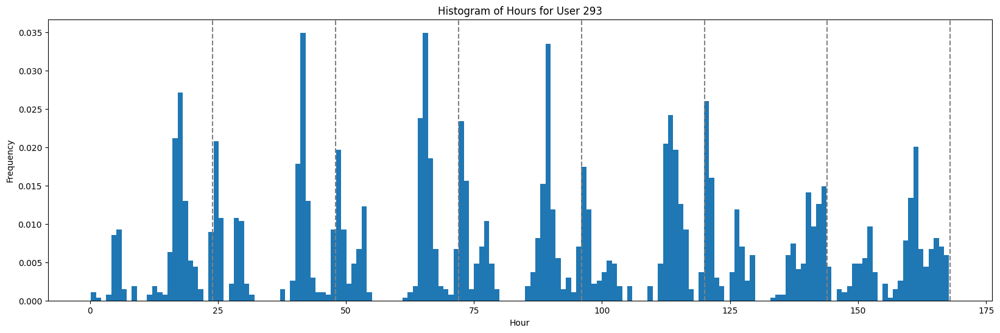

In [8]:
# Plot the histogram

plt.figure(figsize=(20, 6))# Adjust the width and height as needed
#sns.kdeplot(user_293_all_days['Hour'])
plt.hist(user_293_all_days['Hour'], bins=168, density=True)
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.title('Histogram of Hours for User 293')

# Plot vertical lines at specific hours

hours = [24, 48, 72, 96, 120, 144, 168]
for hour in hours:
    plt.axvline(hour, color='gray', linestyle='--')


plt.show()

#Faltaria ver que se puede representar esa densidad


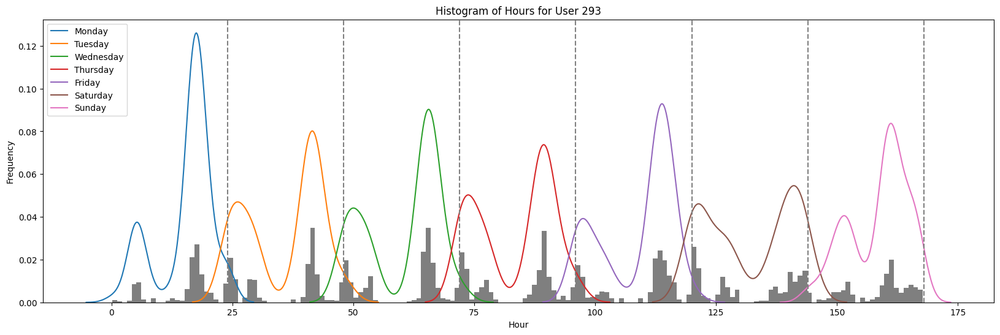

In [9]:
# Plot the histogram

plt.figure(figsize=(20, 6))

# Iterate over each day of the week
for day in user_293_all_days['DAY_OF_THE_WEEK'].unique():
    # Filter the data for the current day
    data = user_293_all_days[user_293_all_days['DAY_OF_THE_WEEK'] == day]['Hour']
    
    # Plot the KDE plot for the current day
    sns.kdeplot(data, label=day)

# Plot the histogram
plt.hist(user_293_all_days['Hour'], bins=168, density=True)
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.title('Histogram of Hours for User 293')

# Plot vertical lines at specific hours

hours = [24, 48, 72, 96, 120, 144, 168]
for hour in hours:
    plt.axvline(hour, color='gray', linestyle='--')

plt.legend()
plt.show()

#MAYBE TRY THIS The image below illustrate my question. I added the blue line using a KernelDensity 
# (KernelDensity(kernel='Gaussian', bandwidth=1.5).fit(price,sample_weight=quantity)

## 2)Histograma semanal de cualquier usuario:

In [10]:
""" Va a sacar la grafica de todos los usuarios

usuarios=df[['User ID', 'UTC time']] 

# Iterate over each unique user ID
for user_id in usuarios['User ID'].unique():
    # Select the data for the current user
    user_data = usuarios[usuarios['User ID'] == user_id]
    user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
    user_data = user_data.sort_values('UTC time')
    user_data['DAY_OF_THE_WEEK'] = user_data['UTC time'].dt.day_name()
    user_data_monday = user_data[user_data['DAY_OF_THE_WEEK'] == 'Monday']

    # Create a column that represents the hours of the day
    user_data_monday['Hour'] = user_data_monday['UTC time'].dt.hour + user_data_monday['UTC time'].dt.minute / 60

    # Plot the histogram for Monday
    tau_monday = user_data_monday['Hour']
    print(f"User ID: {user_id}")
    print(f"Max Hour on Monday: {max(tau_monday)}")
    print(f"Min Hour on Monday: {min(tau_monday)}")
    sns.kdeplot(tau_monday)
    plt.hist(tau_monday, bins=24, density=True)
    plt.xlabel('Hour')
    plt.ylabel('Frequency') 
    plt.title(f'Histogram of Hours on Monday for User {user_id}')
    plt.show()

    # Concatenate the data from all days
    user_data_all_days = pd.concat([user_data_monday, user_data[user_data['DAY_OF_THE_WEEK'] != 'Monday']])

    # Create a column that represents the hours of the day
    user_data_all_days['Hour'] = user_data_all_days['UTC time'].dt.dayofweek * 24 + user_data_all_days['UTC time'].dt.hour + user_data_all_days['UTC time'].dt.minute / 60

    # Plot the histogram for all days
    plt.figure(figsize=(20, 6))
    plt.hist(user_data_all_days['Hour'], bins=168, density=True)
    plt.xlabel('Hour')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of Hours for User {user_id}')

    # Plot vertical lines at specific hours
    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')

    plt.show()
    """ 


' Va a sacar la grafica de todos los usuarios\n\nusuarios=df[[\'User ID\', \'UTC time\']] \n\n# Iterate over each unique user ID\nfor user_id in usuarios[\'User ID\'].unique():\n    # Select the data for the current user\n    user_data = usuarios[usuarios[\'User ID\'] == user_id]\n    user_data[\'UTC time\'] = pd.to_datetime(user_data[\'UTC time\'])\n    user_data = user_data.sort_values(\'UTC time\')\n    user_data[\'DAY_OF_THE_WEEK\'] = user_data[\'UTC time\'].dt.day_name()\n    user_data_monday = user_data[user_data[\'DAY_OF_THE_WEEK\'] == \'Monday\']\n\n    # Create a column that represents the hours of the day\n    user_data_monday[\'Hour\'] = user_data_monday[\'UTC time\'].dt.hour + user_data_monday[\'UTC time\'].dt.minute / 60\n\n    # Plot the histogram for Monday\n    tau_monday = user_data_monday[\'Hour\']\n    print(f"User ID: {user_id}")\n    print(f"Max Hour on Monday: {max(tau_monday)}")\n    print(f"Min Hour on Monday: {min(tau_monday)}")\n    sns.kdeplot(tau_monday)\n  

### 3.1)Creamos un diccionario de todos

In [11]:
usuarios=df[['User ID', 'UTC time']] 


# Create an empty dictionary
hour_dict = {}#SE GUARDARAN LOS VALORES DE LAS HORAS DE CADA USUARIO PARA LOS DIAS DE LA SEMANA SOLAMENTE VERIFICANDO LOS DIAS DE LA SEMANA 

# Iterate over each unique user ID
for user_id in usuarios['User ID'].unique():
    # Select the data for the current user
    user_data = usuarios[usuarios['User ID'] == user_id]
    user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
    user_data = user_data.sort_values('UTC time')
    user_data['DAY_OF_THE_WEEK'] = user_data['UTC time'].dt.day_name()
    user_data_monday = user_data[user_data['DAY_OF_THE_WEEK'] == 'Monday']

    # Create a column that represents the hours of the day
    user_data_monday['Hour'] = user_data_monday['UTC time'].dt.hour + user_data_monday['UTC time'].dt.minute / 60

    # Concatenate the data from all days
    user_data_all_days = pd.concat([user_data_monday, user_data[user_data['DAY_OF_THE_WEEK'] != 'Monday']])

    # Create a column that represents the hours of the day
    user_data_all_days['Hour'] = user_data_all_days['UTC time'].dt.dayofweek * 24 + user_data_all_days['UTC time'].dt.hour + user_data_all_days['UTC time'].dt.minute / 60

    # Save the array as the value of the dictionary with the key being the user ID
    hour_dict[user_id] = user_data_all_days['Hour'].values

# Print the dictionary
#print(hour_dict)

C:\Users\oscar\AppData\Local\Temp\ipykernel_8412\1051623935.py:11: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_8412\1051623935.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_8412\1051623935.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

### 3.2)Funcion para graficar cada usuario


In [12]:
def plot_user_hours(user_id,label=''):
    plt.figure(figsize=(20, 6))
    plt.hist(hour_dict[user_id], bins=168, density=True)
    plt.xlabel('Hour')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of Hours for User {user_id} and cluster {label}')

    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')

    plt.show()

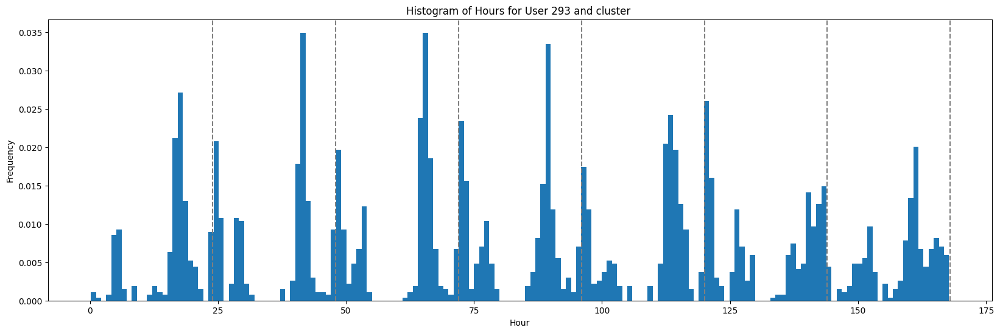

In [13]:
plot_user_hours('293')

In [14]:
hour_dict

{'470': array([ 18.01666667,  18.        ,   1.03333333,   1.73333333,
          7.16666667,   7.16666667,  11.76666667,  12.58333333,
         12.6       ,  12.61666667,  12.65      ,  12.65      ,
         12.66666667,  18.        ,  18.        ,  18.        ,
         42.        ,  47.6       ,  47.76666667,  47.78333333,
         47.78333333,  47.8       ,  47.8       ,  47.85      ,
         47.86666667,  47.86666667,  48.        ,  48.16666667,
         48.2       ,  48.21666667,  48.21666667,  48.23333333,
         48.3       ,  48.31666667,  50.26666667,  50.28333333,
         50.28333333,  50.3       ,  50.3       ,  50.31666667,
         50.33333333,  53.03333333,  53.05      ,  53.3       ,
         53.78333333,  66.        ,  80.16666667,  80.18333333,
         80.18333333,  80.2       ,  80.21666667,  80.65      ,
         80.65      ,  80.86666667,  80.88333333,  80.9       ,
         80.91666667,  80.91666667,  81.        ,  81.03333333,
         81.05      , 147.45     

## 3) Clustering con las frecuencias:

### 3.1) Creamos un diccionario que va a tener las freuencias 

In [15]:
#Hacemos otro diccionario que tenga la frecuencia del histograma de cada usuario para usar esos datos en el clustering
hour_freq_dict = {} #SE GUARDARAN LOS VALORES DE LAS FRECUENCIAS DE LAS HORAS DE CADA USUARIO PARA LOS DIAS DE LA SEMANA SOLAMENTE VERIFICANDO LOS DIAS DE LA SEMANA

# Get the frequencies and bin edges for each array in hour_dict

for user, array in hour_dict.items():
    histo, bin_edges = np.histogram(array, bins=168, density=True) #Sin normalizar
    hour_freq_dict[user] = histo

### 3.2)Calculando el nuemro de clusters :

In [16]:
X = np.vstack(list(hour_freq_dict.values()))
frecuencies = np.array(list(hour_freq_dict.values()))#both are the same

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The 

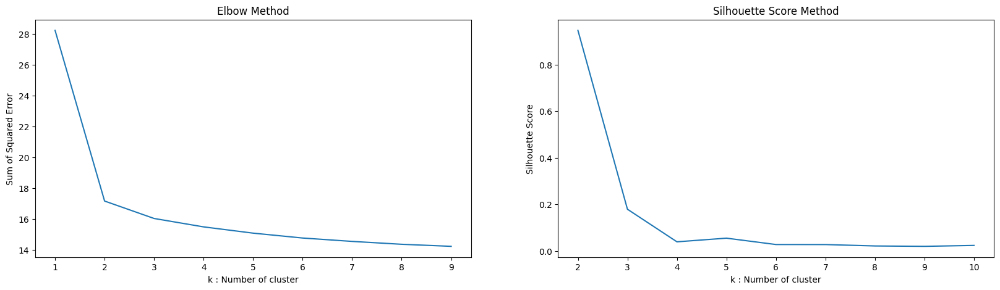

In [17]:
#Find the best number of clusters
def plot_cluster_metrics(data, kmax=10):
    """
    Plots the cluster metrics (Sum of Squared Error and Silhouette Score) for different values of k.

    Parameters:
    - data: The input data for clustering. Works with data frames and arrays.
    - kmax: The maximum number of clusters to consider.

    Returns:
    None
    """
    sse = {}
    sil = []
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20,5))

    # Elbow Method
    axs[0].set_title('Elbow Method')
    for k in range(1, kmax):
        kmeans = KMeans(n_clusters=k, max_iter=100).fit(data)
        sse[k] = kmeans.inertia_
    sns.lineplot(x=list(sse.keys()), y=list(sse.values()), ax=axs[0])
    axs[0].set_xlabel("k : Number of cluster")
    axs[0].set_ylabel("Sum of Squared Error")

    # Silhouette Score Method
    axs[1].set_title('Silhouette Score Method')
    for k in range(2, kmax + 1):
        kmeans = KMeans(n_clusters=k, random_state=10).fit(data)
        labels = kmeans.labels_
        sil.append(silhouette_score(data, labels, metric='euclidean'))
    sns.lineplot(x=range(2, kmax + 1), y=sil, ax=axs[1])
    axs[1].set_xlabel("k : Number of cluster")
    axs[1].set_ylabel("Silhouette Score")

    plt.show()

# Call the function with your data
plot_cluster_metrics(frecuencies, kmax=10)

### 3.3)Aplicando kmeans con distancia euclidiana

In [83]:
# Define the number of clusters
n_clusters = 5 

# Initialize KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0)

# Fit KMeans model to the data
kmeans.fit(X)
labels = kmeans.labels_

# Get cluster labels for each user
cluster_labels_dict = hour_dict.copy()
for user, histogram in hour_freq_dict.items():
    cluster_labels_dict[user] = kmeans.predict([histogram])[0]#solo cluster y usuario TRUST

# El problema con el siguente es que es posible que la asignacion del cluster no este bien, parece que se hace con el mismo orden
hour_dict_with_clabels = hour_dict.copy()
for i, user_id in enumerate(hour_dict_with_clabels.keys()):
    hour_dict_with_clabels[user_id] = (hour_dict_with_clabels[user_id], labels[i])
#each user ID key is associated with a tuple of the form (user_array, cluster_label), where user_array is the array of 
# hours and cluster_label is the cluster label assigned to the user.

cluster_counts = Counter(cluster_labels_dict.values())
print('El nuemro de usuarios por cluster es:', cluster_counts)

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


El nuemro de usuarios por cluster es: Counter({0: 625, 3: 223, 4: 170, 1: 64, 2: 1})


In [86]:
# Extract the cluster labels from the tuples in the dictionary values
cluster_labels = [value[1] for value in hour_dict_with_clabels.values()]

# Count the cluster labels
cluster_counts = Counter(cluster_labels)

print('El nuemro de usuarios por cluster es:', cluster_counts)

El nuemro de usuarios por cluster es: Counter({0: 625, 3: 223, 4: 170, 1: 64, 2: 1})


Comprobando los clusters de los usuarios:

In [85]:
# Iterate over the keys of d1 (assuming the keys are the users)
for user in cluster_labels_dict:
    # Check if the user exists in d2
    if user in hour_dict_with_clabels:
        # Compare the group numbers associated with the user
        group_number_d1 = cluster_labels_dict[user]
        group_number_d2 = hour_dict_with_clabels[user][1]  # Assuming the group number is in the second element of the tuple
        if group_number_d1 != group_number_d2:
            # Print an error message if the group numbers are different
            print(f"Error: Group numbers for user {user} are different between d1 and d2")
            break
        else:
            print(f"User {user} is in the same group in d1 and d2")


User 470 is in the same group in d1 and d2
User 979 is in the same group in d1 and d2
User 69 is in the same group in d1 and d2
User 395 is in the same group in d1 and d2
User 87 is in the same group in d1 and d2
User 484 is in the same group in d1 and d2
User 642 is in the same group in d1 and d2
User 292 is in the same group in d1 and d2
User 428 is in the same group in d1 and d2
User 877 is in the same group in d1 and d2
User 625 is in the same group in d1 and d2
User 691 is in the same group in d1 and d2
User 116 is in the same group in d1 and d2
User 931 is in the same group in d1 and d2
User 53 is in the same group in d1 and d2
User 445 is in the same group in d1 and d2
User 135 is in the same group in d1 and d2
User 895 is in the same group in d1 and d2
User 704 is in the same group in d1 and d2
User 891 is in the same group in d1 and d2
User 284 is in the same group in d1 and d2
User 901 is in the same group in d1 and d2
User 803 is in the same group in d1 and d2
User 699 is in

In [20]:
combined_dict = {}

for user in hour_dict:
    # Check if the user exists in both dictionaries
    if user in cluster_labels_dict:
        # Combine the array of values from dic1 and the code from dic2
        combined_dict[user] = {'array': hour_dict[user], 'cluster': cluster_labels_dict[user]}

In [21]:
combined_dict

{'470': {'array': array([ 18.01666667,  18.        ,   1.03333333,   1.73333333,
           7.16666667,   7.16666667,  11.76666667,  12.58333333,
          12.6       ,  12.61666667,  12.65      ,  12.65      ,
          12.66666667,  18.        ,  18.        ,  18.        ,
          42.        ,  47.6       ,  47.76666667,  47.78333333,
          47.78333333,  47.8       ,  47.8       ,  47.85      ,
          47.86666667,  47.86666667,  48.        ,  48.16666667,
          48.2       ,  48.21666667,  48.21666667,  48.23333333,
          48.3       ,  48.31666667,  50.26666667,  50.28333333,
          50.28333333,  50.3       ,  50.3       ,  50.31666667,
          50.33333333,  53.03333333,  53.05      ,  53.3       ,
          53.78333333,  66.        ,  80.16666667,  80.18333333,
          80.18333333,  80.2       ,  80.21666667,  80.65      ,
          80.65      ,  80.86666667,  80.88333333,  80.9       ,
          80.91666667,  80.91666667,  81.        ,  81.03333333,
         

### 3.4)Graficando los clusters:

In [87]:
# Select 5 random users for each cluster
random_users = {}
for cluster in range(n_clusters):  # range is the number of clusters
    users_in_cluster = [user for user, (user_array, cluster_label) in hour_dict_with_clabels.items() if cluster_label == cluster]
    if len(users_in_cluster) >= 5:
        random_users[cluster] = random.sample(users_in_cluster, 5)
    else:
        random_users[cluster] = users_in_cluster  
        

In [88]:
random_users

{0: ['623', '529', '877', '410', '756'],
 1: ['913', '931', '57', '356', '1026'],
 2: ['587'],
 3: ['26', '309', '754', '386', '23'],
 4: ['501', '1034', '272', '253', '746']}

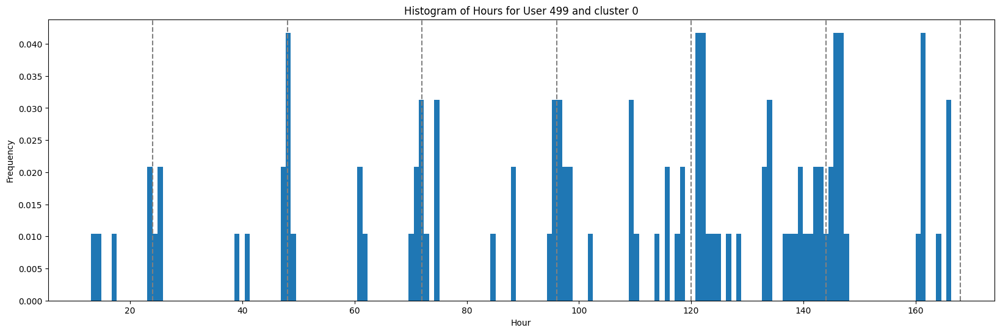

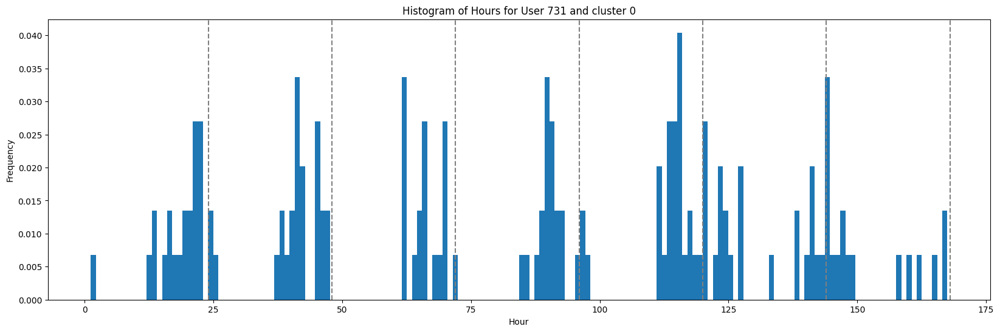

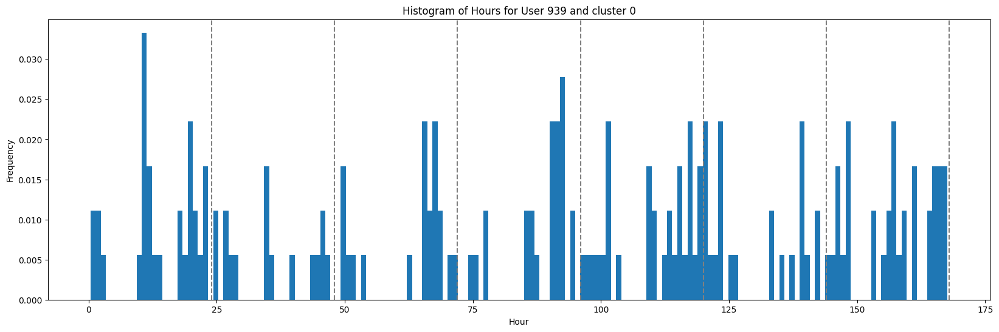

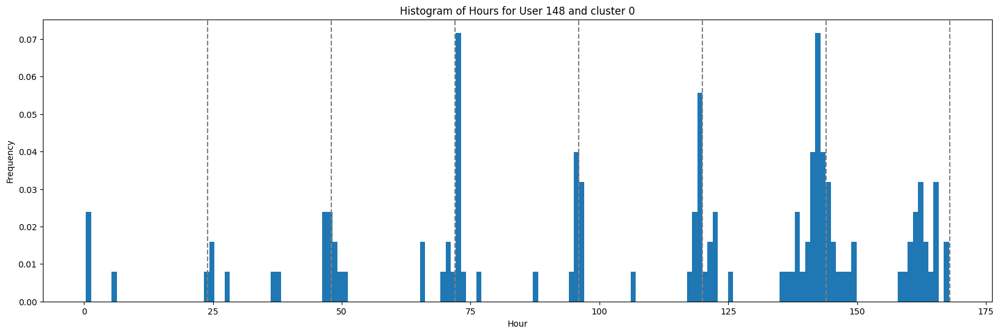

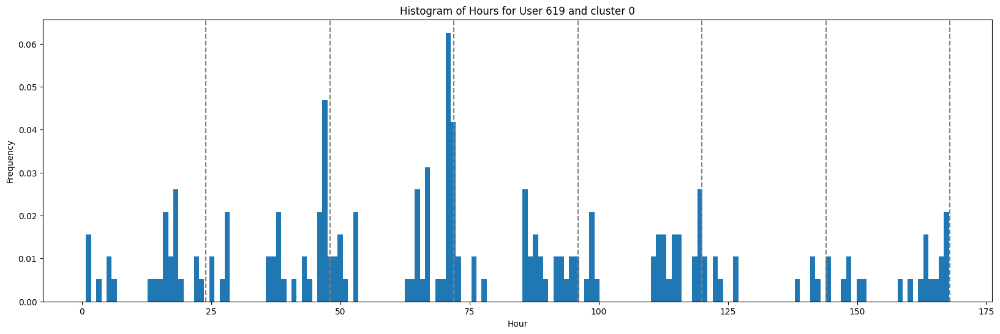

...

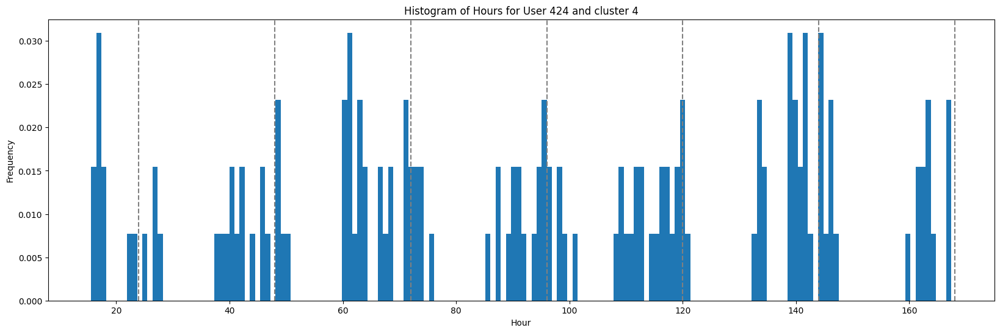

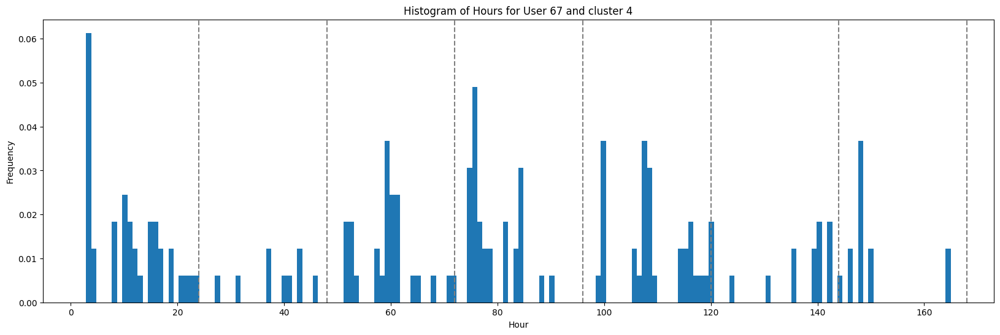

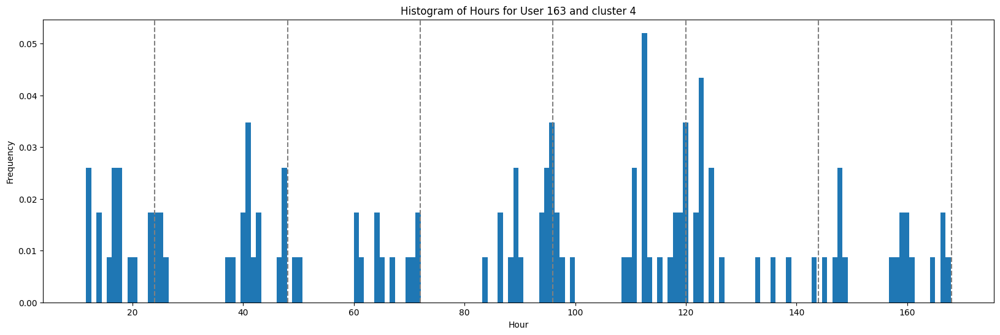

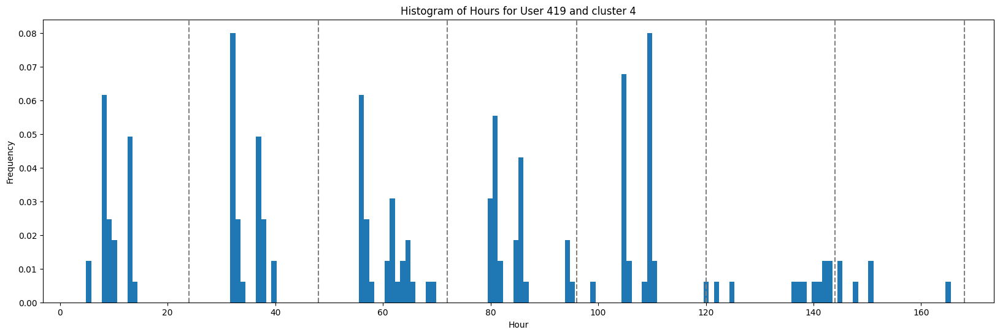

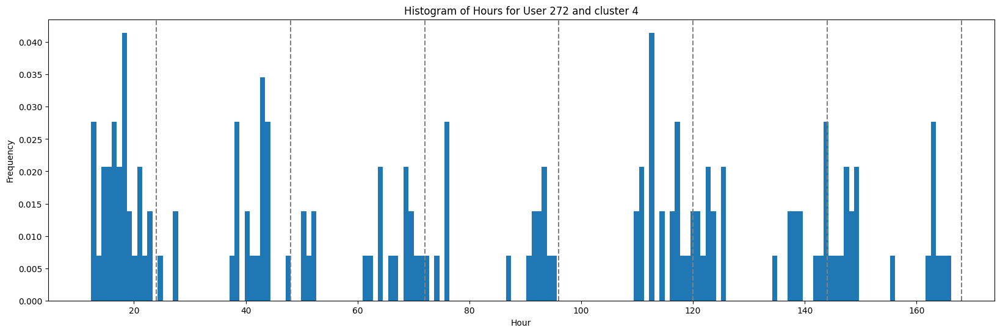

In [24]:
# Plot the hours for the selected users
for cluster, users in random_users.items():
    for user in users:
        plot_user_hours(user,cluster)

## 4)Grafica conjunta de las curvas de las frecuencias:

In [52]:

def plot_users(user_dict, code):
    """
    Plot histograms for users with a given code.

    Parameters:
    - user_dict (dict): A dictionary containing user IDs as keys and their corresponding values.
    - code (str): The code to filter users.

    Returns:
    None
    """
    # Filter users with given code
    users_with_code = {user_id: values for user_id, values in user_dict.items() if values[1] == code}

    # Get the values for users with given code
    values_with_code = [values[0] for values in users_with_code.values()]

    # Plot each user's histogram
    plt.figure(figsize=(20, 6))
    for i, values in enumerate(values_with_code):
        hist, bin_edges = np.histogram(values, density=True, bins=168)
        plt.plot(bin_edges[1::], hist, linestyle='-', color='gray')#, label=f'User {i+1}')
    
    plt.xlabel(r'$\tau$(horas)')
    plt.ylabel(r'$\rho(\tau)$')
    plt.title(f'Scatter Plot of Histo vs Bin Edges for cluster {code}')
    plt.legend()
    plt.show()



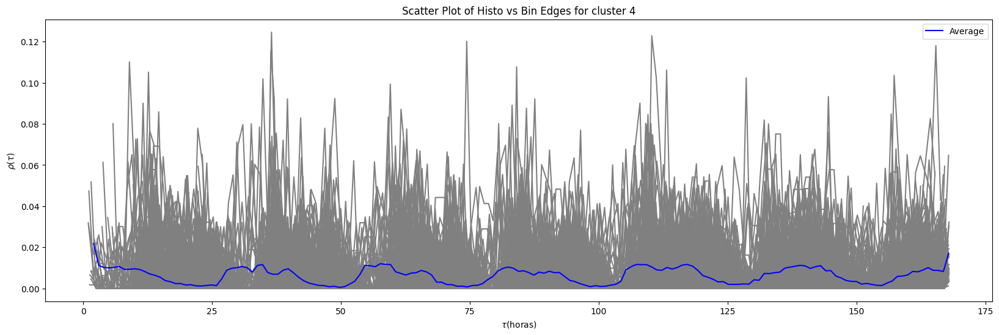

In [90]:
plot_users(hour_dict_with_clabels, 4)

In [119]:
def plot_users(user_dict, code):
    """
    Plot histograms for users with a given code and the average histogram.

    Parameters:
    - user_dict (dict): A dictionary containing user IDs as keys and their corresponding values.
    - code (str): The code to filter users.

    Returns:
    None
    """
    # Filter users with given code
    users_with_code = {user_id: values for user_id, values in user_dict.items() if values[1] == code}

    # Get the values for users with given code
    values_with_code = [values[0] for values in users_with_code.values()]

    # Initialize list to store all histograms
    all_histograms = []

    # Plot each user's histogram and store it in the list
    plt.figure(figsize=(20, 6))
    for i, values in enumerate(values_with_code):
        hist, bin_edges = np.histogram(values, density=True, bins=168)
        plt.plot(bin_edges[1::], hist, linestyle='-', color='gray', linewidth=0.1)#, label=f'User {i+1}')
        all_histograms.append(hist)

    # Calculate and plot the average histogram
    average_histogram = np.mean(all_histograms, axis=0)
    plt.plot(bin_edges[1::], average_histogram, linestyle='-', color='c', linewidth=2.5, label='Average')

    plt.xlabel(r'$\tau$(horas)')
    plt.ylabel(r'$\rho(\tau)$')
    plt.title(f'Scatter Plot of Histo vs Bin Edges for cluster {code}')
    plt.legend()
    #plt.ylim(0, 0.07)
    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')

    plt.show()
    
    

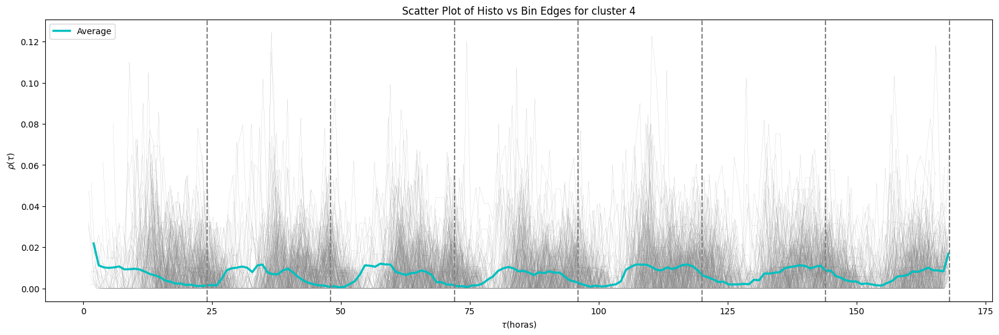

In [121]:
plot_users(hour_dict_with_clabels, 4)

 i have a dictionary, the keys are users id and the values are a tuple with an array of values and a code, i wnat to use np.histogram and graph all the frecuencies vs the bin_edges for the users that belong to the code '5' make a code

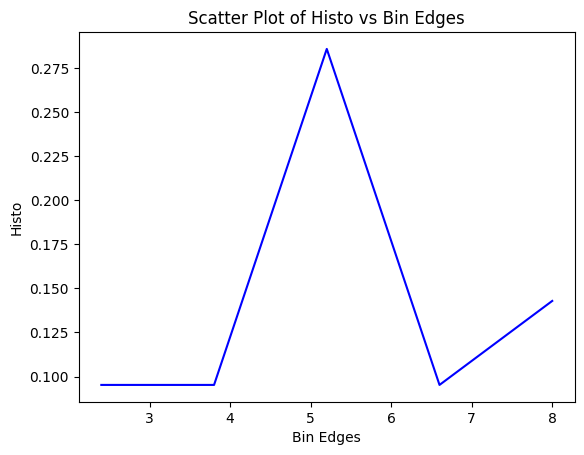

In [27]:

user_dict = {
    'user1': (np.array([1, 2, 3, 4, 5]), '5'),
    'user2': (np.array([2, 3, 4, 5, 6]), '3'),
    'user3': (np.array([3, 4, 5, 6, 7]), '5'),
    'user4': (np.array([4, 5, 6, 7, 8]), '5'),
    'user5': (np.array([5, 6, 7, 8, 9]), '2')
}

# Filter users with code '5'
users_code_5 = {user_id: values for user_id, values in user_dict.items() if values[1] == '5'}

# Get the values for users with code '5'
values_code_5 = [values[0] for values in users_code_5.values()]

# Calculate the histogram
hist, bin_edges = np.histogram(values_code_5, density=True, bins=5)


plt.plot(bin_edges[1::], hist, linestyle='-', color='blue')
plt.xlabel('Bin Edges')
plt.ylabel('Histo')
plt.title('Scatter Plot of Histo vs Bin Edges')
plt.show()


In [41]:
histo, bin_edges = np.histogram(hour_dict_with_clabels['456'][0], bins=168, density=True)


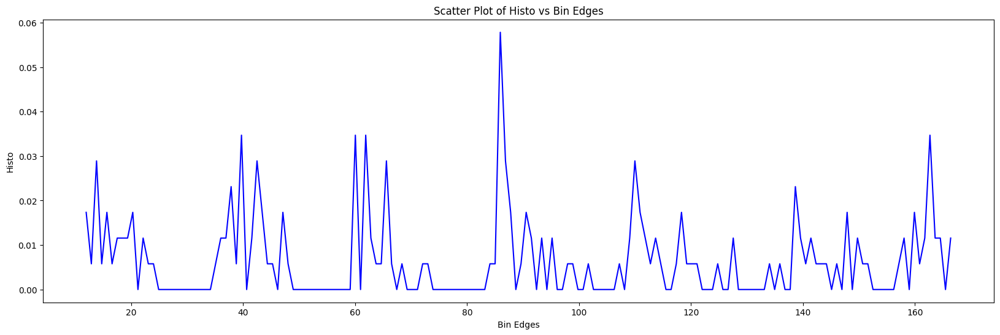

In [42]:
plt.figure(figsize=(20, 6))
plt.plot(bin_edges[1::], histo, linestyle='-', color='blue')
plt.xlabel('Bin Edges')
plt.ylabel('Histo')
plt.title('Scatter Plot of Histo vs Bin Edges')
plt.show()


# Ejemplo gausiana 

In [30]:

gausian = np.random.normal(loc=84, scale=42, size=1000000)
histo, bin_edges = np.histogram(gausian, bins=168, density=True)

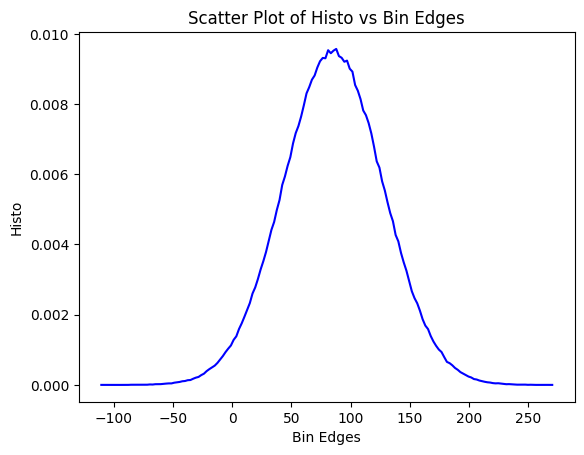

In [31]:
plt.plot(bin_edges[1::], histo, linestyle='-', color='blue')
plt.xlabel('Bin Edges')
plt.ylabel('Histo')
plt.title('Scatter Plot of Histo vs Bin Edges')
plt.show()


### 3.6) Intentando con Aglomerative clustering 

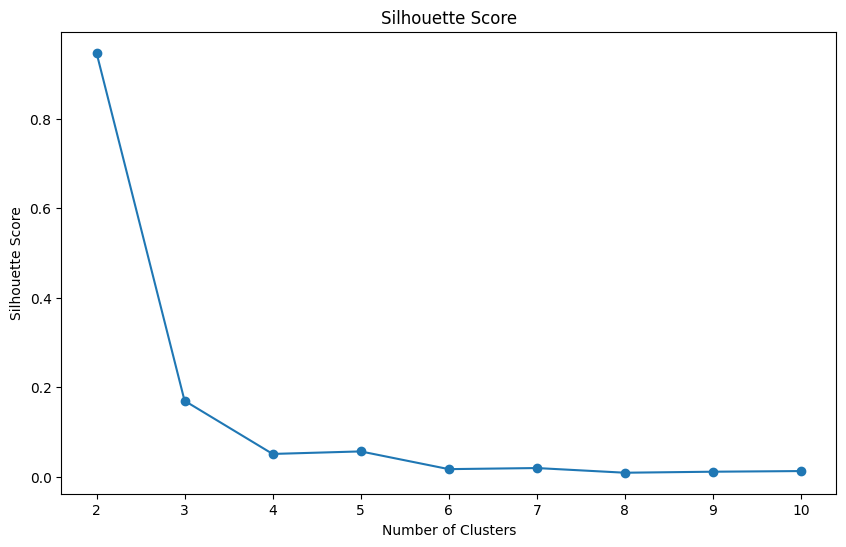

In [32]:
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
X = np.vstack(list(hour_freq_dict.values()))
# Calculate the silhouette score for different number of clusters
silhouette_scores = []
for n_clusters in range(2, 11):
    model = AgglomerativeClustering(n_clusters=n_clusters)
    labels = model.fit_predict(X)
    silhouette_scores.append(silhouette_score(X, labels))

# Plot the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()


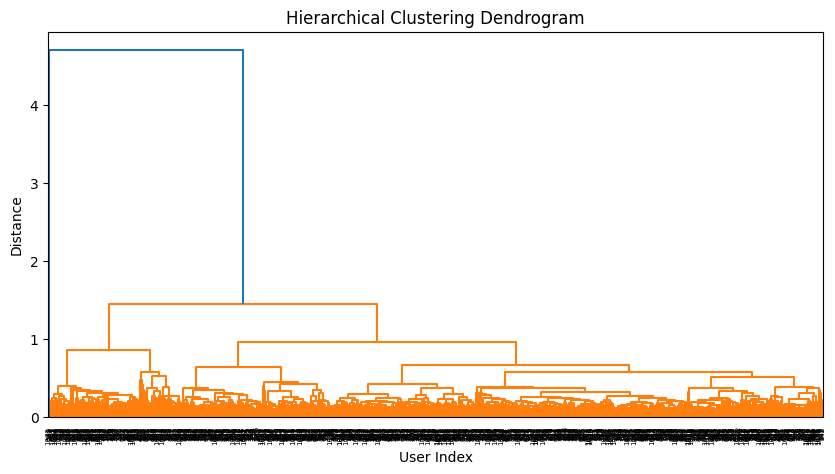

El nuemro de usuarios por cluster es: Counter({0: 485, 5: 203, 4: 127, 6: 112, 1: 95, 2: 60, 3: 1})


In [33]:

X = np.vstack(list(hour_freq_dict.values()))
frecuencies = np.array(list(hour_freq_dict.values()))#both are the same

# Compute pairwise distances between histograms using Euclidean distance
distance_matrix = pdist(X)

# Compute the linkage matrix
Z = linkage(distance_matrix, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('User Index')
plt.ylabel('Distance')
plt.show()

n_clusters = 7  # Number of clusters to form

# Initialize AgglomerativeClustering model
agglomerative = AgglomerativeClustering(n_clusters=n_clusters)

# Fit AgglomerativeClustering model to the data
agglomerative.fit(X)

# Fit AgglomerativeClustering model to the data
cluster_labels = agglomerative.fit_predict(X)

# Add cluster labels to hour_freq_dict
cluster_labels_dict=hour_dict.copy()
for i, (user, _) in enumerate(cluster_labels_dict.items()):
    cluster_labels_dict[user] = cluster_labels[i]
    
hour_dict_with_clabels = hour_dict.copy()
for i, user_id in enumerate(hour_dict_with_clabels.keys()):
    hour_dict_with_clabels[user_id] = (hour_dict_with_clabels[user_id], cluster_labels[i])
    
#numero de usuarios por cluster
cluster_counts = Counter(cluster_labels_dict.values())
print('El nuemro de usuarios por cluster es:', cluster_counts)


In [34]:
hour_dict_with_clabels['354']

(array([12.16666667, 12.16666667, 12.66666667, ..., 60.08333333,
        60.1       , 61.35      ]),
 0)

In [35]:
cluster_labels_dict['354']

0

In [36]:
import random
# Select 5 random users for each cluster
random_users = {}
for cluster in range(n_clusters):  # range is the number of clusters
    users_in_cluster = [user for user, (user_array, cluster_label) in hour_dict_with_clabels.items() if cluster_label == cluster]
    if len(users_in_cluster) >= 5:
        random_users[cluster] = random.sample(users_in_cluster, 5)
    else:
        random_users[cluster] = users_in_cluster
        
print(random_users)

{0: ['107', '638', '1027', '759', '1020'], 1: ['483', '390', '557', '99', '111'], 2: ['778', '1026', '24', '250', '308'], 3: ['587'], 4: ['670', '799', '424', '884', '159'], 5: ['160', '338', '674', '248', '610'], 6: ['513', '891', '443', '162', '561']}
